In [1]:
import iris
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import matplotlib.patches as patch
import pandas as pd
import numpy as np
import os
import glob


import cartopy.crs as ccrs
import cartopy.feature as cfeature

from cartopy.mpl.geoaxes import GeoAxes
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid
import matplotlib as mpl
from palettable.wesanderson import FantasticFox2_5 as ff2
from palettable.wesanderson import Darjeeling3_5 as dj3
from palettable.wesanderson import Darjeeling2_5 as dj2
from palettable.wesanderson import Zissou_5 as ziss5
from palettable.wesanderson import Aquatic1_5 as aqua1
from palettable.wesanderson import Mendl_4 as mend4

from cartopy.util import add_cyclic_point
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER


import sys
sys.path.insert(0,'/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/classes/')
import simulation_dictionary as sdict
from simulation_dictionary import tejen, tejeo, deglg, deglh, loveclim, iloveclim, iloveclim_fwf, iloveclim_uniform, iloveclim_fwf_glac, iloveclim_uniform_glac, famous, itrace, trace, mpi08, mpi10, mpi11, mpi12, miroc, uvic_short, uvic_long
import variable_dictionary as vdict
sys.path.insert(0,'/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/modules/')
import hadcm3_functions as hf 
import loveclim_functions as lf
import itrace_functions as itf
import functions_for_comparisons as func4comp
from functions_for_comparisons import calc_anom_from_lgm20ka_long
import matplotlib.gridspec as gridspec
from regress_func import regress

lon = np.load('/nfs/mary/Users/ee19b2s/work/data/pmip_proj_hs1/1degree_lon.npy')
lat = np.load('/nfs/mary/Users/ee19b2s/work/data/pmip_proj_hs1/1degree_lat.npy')
expt_order_main = [tejen, loveclim, itrace, trace, deglg, mpi10, iloveclim_uniform, iloveclim_uniform_glac, deglh, mpi11, mpi12, iloveclim_fwf, iloveclim_fwf_glac, famous, miroc]
expt_order_main_wUvic = [tejen, loveclim, itrace, trace, deglg, mpi10, iloveclim_uniform, iloveclim_uniform_glac, deglh, mpi11, mpi12, iloveclim_fwf, iloveclim_fwf_glac, famous, miroc, uvic_short, uvic_long]

# fig06: CO2 v absolute 2m temperature with respect to AMOC

In [4]:
start = 20
end = 15
marker_size=750
step=50
cmap=mpl.colors.LinearSegmentedColormap.from_list("", [ziss5.mpl_colors[0], mend4.mpl_colors[1], ziss5.mpl_colors[2]])
var = 'NATL_temp_timeseries10'
expts = [tejen, deglg, deglh, loveclim, iloveclim_fwf, iloveclim_uniform, iloveclim_fwf_glac, iloveclim_uniform_glac, itrace, trace, famous, miroc, mpi10, mpi11, mpi12, uvic_short, uvic_long]
#markers = ['.', 'v', '1', 's', 'p', 'P', 'h', 'x', 'D', '*', 'X', 'd', '<', '8', '>', 'o', '2']
markers = ['o', 'v', 'P', '*', 'p', 'o', 'v', 'P', '*', 'p', 'o', 'v', 'P', '*', 'p', 'o', 'v', 'P', '*', 'p']

fig, axs = plt.subplots(2,2, sharex = True, figsize = (35, 35), dpi = 300, gridspec_kw = {'hspace': 0.12, 'wspace': 0.05})

#axs = axs.flat
for expt,marker in zip(expt_order_main, markers):

    co2 = expt['co2_type']
    if 'uniform' == expt['meltwater_scenario']:
    
        time100 = []
        for i in range(len(co2['time(ka)'])):
            if i%step == 0:
                time100.append(co2['time(ka)'][i])
        time100 = np.array(time100)

        expt_time100 = hf.means_10yr_calc(expt['time10'], step=int(step/10))
        start_index_SAT = hf.find_nearest_value(expt_time100, start)
        stop_index_SAT = hf.find_nearest_value(expt_time100, end) 

        expt_var100 = hf.means_10yr_calc(expt[var],step=int(step/10))
        
        if 'loveclim' in expt['expt_name']:
            SAT_to_plot = np.array(expt_var100[start_index_SAT:stop_index_SAT])
        else:
            SAT_to_plot = np.array(expt_var100[start_index_SAT:stop_index_SAT])

        expt_amoc100 = hf.means_10yr_calc(expt['NH_max_amoc10'],step=int(step/10))
        AMOC_to_plot = np.array(expt_amoc100[start_index_SAT:stop_index_SAT])

        stop_index_CO2 = hf.find_nearest_value(time100, end)
        start_index_CO2 = hf.find_nearest_value(time100, start)

        co2_100 = hf.means_10yr_calc(co2['co2'], step=step)
        CO2_to_plot = co2_100[start_index_CO2:stop_index_CO2]

        mapp = axs[0,0].scatter(CO2_to_plot, SAT_to_plot, c=AMOC_to_plot, cmap=cmap, s=marker_size, marker=marker, edgecolors='black', label=expt['label'], vmin=0, vmax=30)
        axs[0,0].set_title('melt-uniform', fontsize=50)
    elif 'routed' == expt['meltwater_scenario']:
        
        time100 = []
        for i in range(len(co2['time(ka)'])):
            if i%step == 0:
                time100.append(co2['time(ka)'][i])
        time100 = np.array(time100)

        expt_time100 = hf.means_10yr_calc(expt['time10'],step=int(step/10))
        start_index_SAT = hf.find_nearest_value(expt_time100, start)
        stop_index_SAT = hf.find_nearest_value(expt_time100, end) 

        expt_var100 = hf.means_10yr_calc(expt[var],step=int(step/10))
        
        SAT_to_plot = np.array(expt_var100[start_index_SAT:stop_index_SAT])

        expt_amoc100 = hf.means_10yr_calc(expt['NH_max_amoc10'],step=int(step/10))
        AMOC_to_plot = np.array(expt_amoc100[start_index_SAT:stop_index_SAT])

        stop_index_CO2 = hf.find_nearest_value(time100, end)
        start_index_CO2 = hf.find_nearest_value(time100, start)

        stop_index_CO2 = hf.find_nearest_value(time100, end)
        start_index_CO2 = hf.find_nearest_value(time100, start)

        co2_100 = hf.means_10yr_calc(co2['co2'], step=step)
        CO2_to_plot = co2_100[start_index_CO2:stop_index_CO2]

        mapp = axs[0,1].scatter(CO2_to_plot, SAT_to_plot, c=AMOC_to_plot, cmap=cmap, s=marker_size, marker=marker, edgecolors='black', label=expt['label'], vmin=0, vmax=30)
        axs[0,1].set_title('melt-routed', fontsize=50)
    elif 'trace' in expt['meltwater_scenario']:
        if 'trace' == expt['expt_name']:
            time10 = expt['co2_type']['time(ka)']
            co2_10 = expt['co2_type']['co2']
            
            time100 = []
            for i in range(len(time10)):
                if i%(step/10) == 0:
                    time100.append(time10[i])
            time100 = np.array(time100)
            co2_100 = hf.means_10yr_calc(co2_10, step=int(step/10))

        else:
            time100 = []
            for i in range(len(co2['time(ka)'])):
                if i%step == 0:
                    time100.append(co2['time(ka)'][i])
            time100 = np.array(time100)
            co2_100 = hf.means_10yr_calc(co2['co2'], step=step)

        expt_time100 = hf.means_10yr_calc(expt['time10'],step=int(step/10))
        start_index_SAT = hf.find_nearest_value(expt_time100, start)
        stop_index_SAT = hf.find_nearest_value(expt_time100, end) 

        expt_var100 = hf.means_10yr_calc(expt[var],step=int(step/10))
        
        SAT_to_plot = np.array(expt_var100[start_index_SAT:stop_index_SAT])

        expt_amoc100 = hf.means_10yr_calc(expt['NH_max_amoc10'],step=int(step/10))
        AMOC_to_plot = np.array(expt_amoc100[start_index_SAT:stop_index_SAT])

        stop_index_CO2 = hf.find_nearest_value(time100, end)
        start_index_CO2 = hf.find_nearest_value(time100, start)

        stop_index_CO2 = hf.find_nearest_value(time100, end)
        start_index_CO2 = hf.find_nearest_value(time100, start)
        
        CO2_to_plot = co2_100[start_index_CO2:stop_index_CO2]
        mapp = axs[1,0].scatter(CO2_to_plot, SAT_to_plot, c=AMOC_to_plot, cmap=cmap, s=marker_size, marker=marker, edgecolors='black', label=expt['label'], vmin=0, vmax=30)

        axs[1,0].set_title('TraCE-like', fontsize=50)
    else:
        if 'uvic' in expt['expt_name']:
            start_index_SAT = hf.find_nearest_value(expt['time10'], start)
            stop_index_SAT = hf.find_nearest_value(expt['time10'], end) 

            SAT_to_plot = np.array(expt[var])[start_index_SAT:stop_index_SAT]

            AMOC_to_plot = np.array(expt['NH_max_amoc10'][start_index_SAT:stop_index_SAT])

            start_index_CO2 = hf.find_nearest_value(expt['time10'], start)
            stop_index_CO2 = hf.find_nearest_value(expt['time10'], end)

            CO2_to_plot = co2['co2'][start_index_CO2:stop_index_CO2]
        elif 'miroc' == expt['expt_name']:
            time10 = []
            for i in range(len(co2['time(ka)'])):
                if i%10 == 0:
                    time10.append(co2['time(ka)'][i])
            time10 = np.array(time10)

            start_index_SAT = hf.find_nearest_value(expt['time10'], start)
            stop_index_SAT = hf.find_nearest_value(expt['time10'], end) 

        
            SAT_to_plot = np.array(expt[var][start_index_SAT:stop_index_SAT])

            AMOC_to_plot = np.array(expt['NH_max_amoc10'][start_index_SAT:stop_index_SAT])

            stop_index_CO2 = hf.find_nearest_value(time10, end)
            start_index_CO2 = hf.find_nearest_value(time10, start)

            co2_10 = hf.means_10yr_calc(co2['co2'], step=10)
            CO2_to_plot = co2_10[start_index_CO2:stop_index_CO2]

        else:
            time100 = []
            for i in range(len(co2['time(ka)'])):
                if i%step == 0:
                    time100.append(co2['time(ka)'][i])
            time100 = np.array(time100)

            expt_time100 = hf.means_10yr_calc(expt['time10'],step=int(step/10))
            start_index_SAT = hf.find_nearest_value(expt_time100, start)
            stop_index_SAT = hf.find_nearest_value(expt_time100, end) 

            expt_var100 = hf.means_10yr_calc(expt[var],step=int(step/10))

            SAT_to_plot = np.array(expt_var100[start_index_SAT:stop_index_SAT])

            expt_amoc100 = hf.means_10yr_calc(expt['NH_max_amoc10'],step=int(step/10))
            AMOC_to_plot = np.array(expt_amoc100[start_index_SAT:stop_index_SAT])

            stop_index_CO2 = hf.find_nearest_value(time100, end)
            start_index_CO2 = hf.find_nearest_value(time100, start)

            stop_index_CO2 = hf.find_nearest_value(time100, end)
            start_index_CO2 = hf.find_nearest_value(time100, start)

            co2_100 = hf.means_10yr_calc(co2['co2'], step=step)
            CO2_to_plot = co2_100[start_index_CO2:stop_index_CO2]


        mapp = axs[1,1].scatter(CO2_to_plot, SAT_to_plot, c=AMOC_to_plot, cmap=cmap, s=marker_size, marker=marker, edgecolors='black', label=expt['label'], vmin=0, vmax=30)
        axs[1,1].set_title('bespoke', fontsize=50)


axs[1,0].text(1,-0.12,'CO\u2082 (ppmv)', fontsize=50, transform=axs[1,0].transAxes, ha='center')
axs[0,0].text(-0.17,-0.2,'SAT ($^\circ$C)', rotation=90, fontsize=50, transform=axs[0,0].transAxes, ha='center')

axs[0,1].yaxis.set_ticklabels([])
axs[1,1].yaxis.set_ticklabels([])
#axs[1,0].legend(loc='upper right')
axs[0,0].legend(fontsize=35, markerscale=1, loc='lower right')
axs[0,1].legend(fontsize=35, markerscale=1, loc='lower right')
axs[1,0].legend(fontsize=35, markerscale=1, loc='upper right', ncol=2)
axs[1,1].legend(fontsize=35, markerscale=1, loc='upper right')

axs = axs.flat
for i,ax in enumerate(axs):
    ax.set_ylim(-10, 12)
    ax.tick_params('both', labelsize=40)
    ax.grid(axis = 'both', linestyle = '--', linewidth=2)


cb_ax = fig.add_axes([0.92, 0.2, .017, 0.2])
cbar = plt.colorbar(mapp,cax=cb_ax,label='AMOC (Sv)')
cbar.ax.tick_params(labelsize=40)
cbar.set_label('AMOC (Sv)', fontsize=50)
lines = []
labels = []

for ax in fig.axes:
    ax.tick_params(width=2, length=9)
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(2)

   
fig3 = plt.gcf()
fig3.savefig('/nfs/annie/ee19b2s/work/chapter1/figures/figures_for_manuscript/final_figures_pdfs/fig06_NATL_CO2_SAT_AMOC_scatter_absolute.pdf', format='pdf', dpi=300, bbox_inches='tight')

/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/modules/hadcm3_functions.py:280: UserWarning: Warning: converting a masked element to nan.
  outputDATA = np.array(outputDATA)


# figS06: CO2 v 2m temperature anomaly with respect to AMOC

In [13]:
start = 20
end = 15
marker_size=750
step=50
cmap=mpl.colors.LinearSegmentedColormap.from_list("", [ziss5.mpl_colors[0], mend4.mpl_colors[1], ziss5.mpl_colors[2]])
var = 'NATL_temp_timeseries10'
expts = [tejen, deglg, deglh, loveclim, iloveclim_fwf, iloveclim_uniform, iloveclim_fwf_glac, iloveclim_uniform_glac, itrace, trace, famous, miroc, mpi10, mpi11, mpi12, uvic_short, uvic_long]
#markers = ['.', 'v', '1', 's', 'p', 'P', 'h', 'x', 'D', '*', 'X', 'd', '<', '8', '>', 'o', '2']
markers = ['o', 'v', 'P', '*', 'p', 'o', 'v', 'P', '*', 'p', 'o', 'v', 'P', '*', 'p', 'o', 'v', 'P', '*', 'p']

fig, axs = plt.subplots(2,2, sharex = True, figsize = (35, 35), dpi = 300, gridspec_kw = {'hspace': 0.12, 'wspace': 0.05})

#axs = axs.flat
for expt,marker in zip(expt_order_main, markers):

    co2 = expt['co2_type']
    if 'uniform' == expt['meltwater_scenario']:
    
        time100 = []
        for i in range(len(co2['time(ka)'])):
            if i%step == 0:
                time100.append(co2['time(ka)'][i])
        time100 = np.array(time100)

        expt_time100 = hf.means_10yr_calc(expt['time10'], step=int(step/10))
        start_index_SAT = hf.find_nearest_value(expt_time100, start)
        stop_index_SAT = hf.find_nearest_value(expt_time100, end) 

        expt_var100 = hf.means_10yr_calc(func4comp.calc_anom_from_lgm20ka_long(expt[var], expt['time10']),step=int(step/10))
        
        if 'loveclim' in expt['expt_name']:
            SAT_to_plot = np.array(expt_var100[start_index_SAT:stop_index_SAT])
        else:
            SAT_to_plot = np.array(expt_var100[start_index_SAT:stop_index_SAT])

        expt_amoc100 = hf.means_10yr_calc(expt['NH_max_amoc10'],step=int(step/10))
        AMOC_to_plot = np.array(expt_amoc100[start_index_SAT:stop_index_SAT])

        stop_index_CO2 = hf.find_nearest_value(time100, end)
        start_index_CO2 = hf.find_nearest_value(time100, start)

        co2_100 = hf.means_10yr_calc(co2['co2'], step=step)
        CO2_to_plot = co2_100[start_index_CO2:stop_index_CO2]

        mapp = axs[0,0].scatter(CO2_to_plot, SAT_to_plot, c=AMOC_to_plot, cmap=cmap, s=marker_size, marker=marker, edgecolors='black', label=expt['label'], vmin=0, vmax=30)
        axs[0,0].set_title('melt-uniform', fontsize=50)
    elif 'routed' == expt['meltwater_scenario']:
        
        time100 = []
        for i in range(len(co2['time(ka)'])):
            if i%step == 0:
                time100.append(co2['time(ka)'][i])
        time100 = np.array(time100)

        expt_time100 = hf.means_10yr_calc(expt['time10'],step=int(step/10))
        start_index_SAT = hf.find_nearest_value(expt_time100, start)
        stop_index_SAT = hf.find_nearest_value(expt_time100, end) 

        expt_var100 = hf.means_10yr_calc(func4comp.calc_anom_from_lgm20ka_long(expt[var], expt['time10']),step=int(step/10))
        
        SAT_to_plot = np.array(expt_var100[start_index_SAT:stop_index_SAT])

        expt_amoc100 = hf.means_10yr_calc(expt['NH_max_amoc10'],step=int(step/10))
        AMOC_to_plot = np.array(expt_amoc100[start_index_SAT:stop_index_SAT])

        stop_index_CO2 = hf.find_nearest_value(time100, end)
        start_index_CO2 = hf.find_nearest_value(time100, start)

        stop_index_CO2 = hf.find_nearest_value(time100, end)
        start_index_CO2 = hf.find_nearest_value(time100, start)

        co2_100 = hf.means_10yr_calc(co2['co2'], step=step)
        CO2_to_plot = co2_100[start_index_CO2:stop_index_CO2]

        mapp = axs[0,1].scatter(CO2_to_plot, SAT_to_plot, c=AMOC_to_plot, cmap=cmap, s=marker_size, marker=marker, edgecolors='black', label=expt['label'], vmin=0, vmax=30)
        axs[0,1].set_title('melt-routed', fontsize=50)
    elif 'trace' in expt['meltwater_scenario']:
        if 'trace' == expt['expt_name']:
            time10 = expt['co2_type']['time(ka)']
            co2_10 = expt['co2_type']['co2']
            
            time100 = []
            for i in range(len(time10)):
                if i%(step/10) == 0:
                    time100.append(time10[i])
            time100 = np.array(time100)
            co2_100 = hf.means_10yr_calc(co2_10, step=int(step/10))

        else:
            time100 = []
            for i in range(len(co2['time(ka)'])):
                if i%step == 0:
                    time100.append(co2['time(ka)'][i])
            time100 = np.array(time100)
            co2_100 = hf.means_10yr_calc(co2['co2'], step=step)

        expt_time100 = hf.means_10yr_calc(expt['time10'],step=int(step/10))
        start_index_SAT = hf.find_nearest_value(expt_time100, start)
        stop_index_SAT = hf.find_nearest_value(expt_time100, end) 

        expt_var100 = hf.means_10yr_calc(func4comp.calc_anom_from_lgm20ka_long(expt[var], expt['time10']),step=int(step/10))
        
        SAT_to_plot = np.array(expt_var100[start_index_SAT:stop_index_SAT])

        expt_amoc100 = hf.means_10yr_calc(expt['NH_max_amoc10'],step=int(step/10))
        AMOC_to_plot = np.array(expt_amoc100[start_index_SAT:stop_index_SAT])

        stop_index_CO2 = hf.find_nearest_value(time100, end)
        start_index_CO2 = hf.find_nearest_value(time100, start)

        stop_index_CO2 = hf.find_nearest_value(time100, end)
        start_index_CO2 = hf.find_nearest_value(time100, start)
        
        CO2_to_plot = co2_100[start_index_CO2:stop_index_CO2]
        mapp = axs[1,0].scatter(CO2_to_plot, SAT_to_plot, c=AMOC_to_plot, cmap=cmap, s=marker_size, marker=marker, edgecolors='black', label=expt['label'], vmin=0, vmax=30)

        axs[1,0].set_title('TraCE-like', fontsize=50)
    else:
        if 'uvic' in expt['expt_name']:
            start_index_SAT = hf.find_nearest_value(expt['time10'], start)
            stop_index_SAT = hf.find_nearest_value(expt['time10'], end) 

            SAT_to_plot = np.array(func4comp.calc_anom_from_lgm20ka_long(expt[var], expt['time10'])[start_index_SAT:stop_index_SAT])

            AMOC_to_plot = np.array(expt['NH_max_amoc10'][start_index_SAT:stop_index_SAT])

            start_index_CO2 = hf.find_nearest_value(expt['time10'], start)
            stop_index_CO2 = hf.find_nearest_value(expt['time10'], end)

            CO2_to_plot = co2['co2'][start_index_CO2:stop_index_CO2]
        elif 'miroc' == expt['expt_name']:
            time10 = []
            for i in range(len(co2['time(ka)'])):
                if i%10 == 0:
                    time10.append(co2['time(ka)'][i])
            time10 = np.array(time10)

            start_index_SAT = hf.find_nearest_value(expt['time10'], start)
            stop_index_SAT = hf.find_nearest_value(expt['time10'], end) 

        
            expt_var10 = func4comp.calc_anom_from_lgm20ka_long(expt[var], expt['time10'])
    
            SAT_to_plot = np.array(expt_var10[start_index_SAT:stop_index_SAT])
    
            AMOC_to_plot = np.array(expt['NH_max_amoc10'][start_index_SAT:stop_index_SAT])

            stop_index_CO2 = hf.find_nearest_value(time10, end)
            start_index_CO2 = hf.find_nearest_value(time10, start)

            co2_10 = hf.means_10yr_calc(co2['co2'], step=10)
            CO2_to_plot = co2_10[start_index_CO2:stop_index_CO2]

        else:
            time100 = []
            for i in range(len(co2['time(ka)'])):
                if i%step == 0:
                    time100.append(co2['time(ka)'][i])
            time100 = np.array(time100)

            expt_time100 = hf.means_10yr_calc(expt['time10'],step=int(step/10))
            start_index_SAT = hf.find_nearest_value(expt_time100, start)
            stop_index_SAT = hf.find_nearest_value(expt_time100, end) 

            expt_var100 = hf.means_10yr_calc(func4comp.calc_anom_from_lgm20ka_long(expt[var], expt['time10']),step=int(step/10))

            SAT_to_plot = np.array(expt_var100[start_index_SAT:stop_index_SAT])

            expt_amoc100 = hf.means_10yr_calc(expt['NH_max_amoc10'],step=int(step/10))
            AMOC_to_plot = np.array(expt_amoc100[start_index_SAT:stop_index_SAT])

            stop_index_CO2 = hf.find_nearest_value(time100, end)
            start_index_CO2 = hf.find_nearest_value(time100, start)

            stop_index_CO2 = hf.find_nearest_value(time100, end)
            start_index_CO2 = hf.find_nearest_value(time100, start)

            co2_100 = hf.means_10yr_calc(co2['co2'], step=step)
            CO2_to_plot = co2_100[start_index_CO2:stop_index_CO2]


        mapp = axs[1,1].scatter(CO2_to_plot, SAT_to_plot, c=AMOC_to_plot, cmap=cmap, s=marker_size, marker=marker, edgecolors='black', label=expt['label'], vmin=0, vmax=30)
        axs[1,1].set_title('bespoke', fontsize=50)


axs[1,0].text(1,-0.12,'CO\u2082 (ppmv)', fontsize=50, transform=axs[1,0].transAxes, ha='center')
axs[0,0].text(-0.17,-0.2,'SAT ($^\circ$C)', rotation=90, fontsize=50, transform=axs[0,0].transAxes, ha='center')

axs[0,1].yaxis.set_ticklabels([])
axs[1,1].yaxis.set_ticklabels([])

axs = axs.flat
for i,ax in enumerate(axs):
    ax.set_ylim(-15, 10)
    ax.tick_params('both', labelsize=40)
    ax.grid(axis = 'both', linestyle = '--', linewidth=2)


cb_ax = fig.add_axes([0.92, 0.2, .017, 0.2])
cbar = plt.colorbar(mapp,cax=cb_ax,label='AMOC (Sv)')
cbar.ax.tick_params(labelsize=40)
cbar.set_label('AMOC (Sv)', fontsize=50)
lines = []
labels = []

for ax in fig.axes:
    axLine, axLabel = ax.get_legend_handles_labels()
    lines.extend(axLine)
    labels.extend(axLabel)
    ax.tick_params(width=2, length=9)
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(2)

for ax in fig.axes[0:-1]:
    ax.legend(fontsize=35, markerscale=1)

   
fig3 = plt.gcf()
fig3.savefig('/nfs/annie/ee19b2s/work/chapter1/figures/figures_for_manuscript/final_supplementary_figures_pdfs/figS06_NATL_CO2_SAT_AMOC_scatter_anomaly.pdf', format='pdf', dpi=300, bbox_inches='tight')

/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/modules/hadcm3_functions.py:287: UserWarning: Warning: converting a masked element to nan.
  outputDATA = np.array(outputDATA)


# fig01: boundary conditions timeseries

/tmp/ipykernel_3626/3963057560.py:57: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "--b" (-> color='b'). The keyword argument will take precedence.
  ln3 = axsCO2.plot(sdict.famous['co2_type']['time(ka)'], sdict.famous['co2_type']['co2'], '--b', color = 'steelblue', label = 'FAMOUS CO\u2082', alpha=.7)


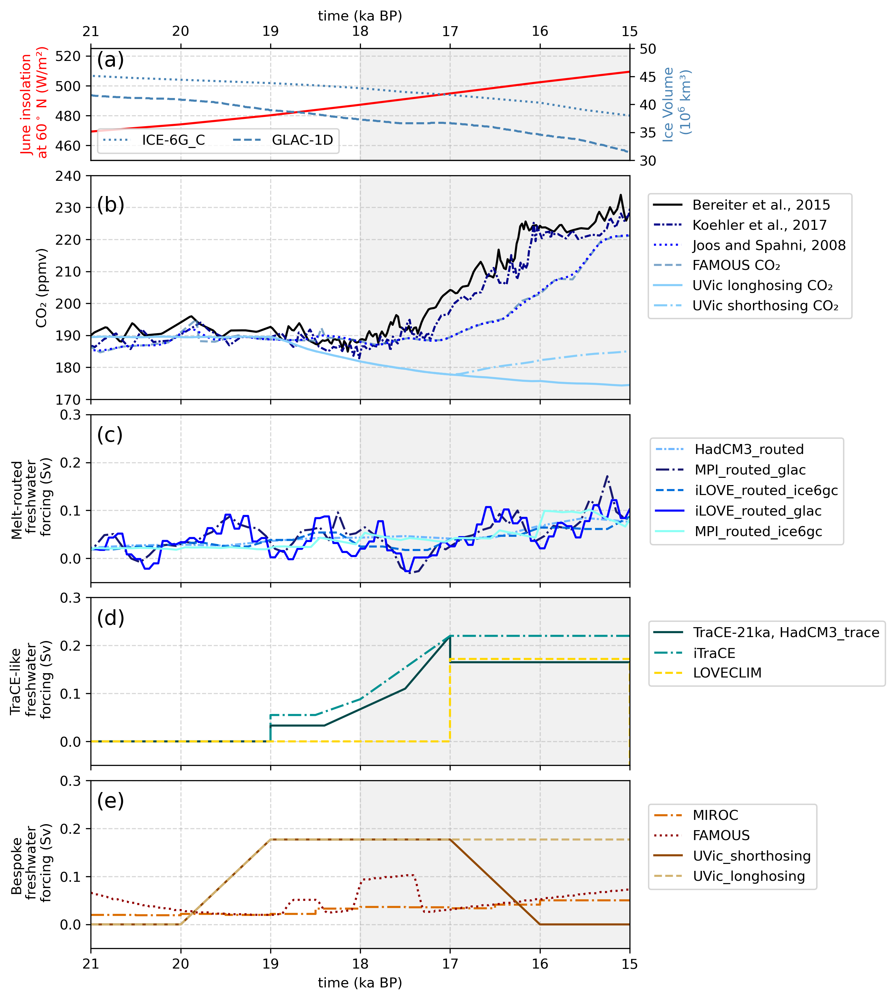

In [3]:
fn_ice = '/nfs/mary/Users/ee19b2s/work/data/downloaded_data/hadcm3/ICE-6G_C_VM5a_water_vol_EDIT.csv'
insol_jun_60N = pd.read_csv('/nfs/mary/Users/ee19b2s/work/data/downloaded_data/hadcm3/orbit_Berger/insol_jun_interpolated.csv')
glac_ice = pd.read_csv('/nfs/mary/Users/ee19b2s/work/data/downloaded_data/glac1d_volume_change.csv')

ice_vol = pd.read_csv(fn_ice,  sep = ',')#, dtype = 'a')#, usecols = ['Time','Vol. Change','Vol since LGM'])# delim_whitespace = True), index_col = False)

ice_vol_array = np.asarray(ice_vol)
t = ice_vol_array[:,0]*-1
ice = ice_vol_array[:,2]*-1
ice = ice.tolist()
t_list = t.tolist()
t_list.reverse()
ice_scaled = [(ice[i]/1000000)+50 for i in range(len(ice))]
t10 = t/1000

glac_ice_vol = (glac_ice['global_ice_volume']+3)
glac_time = glac_ice['time'].tolist()



CO2 = pd.read_csv('/nfs/mary/Users/ee19b2s/work/data/downloaded_data/hadcm3/Model_forcing/CO2_26-0ka_20yr.txt', header=0, index_col=False)['# CO2 from 26-0 ka']
ghg_time = pd.read_csv('/nfs/mary/Users/ee19b2s/work/data/downloaded_data/hadcm3/Model_forcing/age_26-0ka.txt', header=0, index_col=False)['# Age corresponding to lists of CO2']

wkdir = '/nfs/mary/Users/ee19b2s/work/data/downloaded_data/'
koehler_co2 = pd.read_csv(wkdir + 'Koehler-etal_2017/datasets/CO2_stack_156k_raw.tab', sep='\t', skiprows=32, header=1)

ghg_time10=ghg_time/1000

famous_co2 = pd.read_csv('/nfs/mary/Users/ee19b2s/work/data/downloaded_data/FAMOUS_ghg_info/famous_co2.csv', header=0, index_col=False)
famous_co2 = pd.read_csv('/nfs/mary/Users/ee19b2s/work/data/downloaded_data/FAMOUS_ghg_info/famous_co2.csv', header=0, index_col=False)
famous_ch4 = pd.read_csv('/nfs/mary/Users/ee19b2s/work/data/downloaded_data/FAMOUS_ghg_info/famous_ch4.csv', header=0, index_col=False)
famous_n2o = pd.read_csv('/nfs/mary/Users/ee19b2s/work/data/downloaded_data/FAMOUS_ghg_info/famous_n2o.csv', header=0, index_col=False)

CO2 = pd.read_csv('/nfs/mary/Users/ee19b2s/work/data/downloaded_data/hadcm3/Model_forcing/CO2_26-0ka_20yr.txt', header=0, index_col=False)['# CO2 from 26-0 ka']
CH4 = pd.read_csv('/nfs/mary/Users/ee19b2s/work/data/downloaded_data/hadcm3/Model_forcing/CH4_26-0ka_20yr.txt', header=0, index_col=False)['# CH4 26-0 ka interpolated with 20-year timesteps. Data is from Loulergue et al. (2008']
N2O = pd.read_csv('/nfs/mary/Users/ee19b2s/work/data/downloaded_data/hadcm3/Model_forcing/N2O_26-0ka_20yr.txt', header=0, index_col=False)['# N2O 26-0 ka interpolated with 20-year timesteps. Data is from Schilt et al. (2010']
ghg_time = pd.read_csv('/nfs/mary/Users/ee19b2s/work/data/downloaded_data/hadcm3/Model_forcing/age_26-0ka.txt', header=0, index_col=False)['# Age corresponding to lists of CO2']




fig, axs = plt.subplots(5,1, sharex = True, figsize = (7, 12), dpi = 300, gridspec_kw = {'hspace': 0.09, 'wspace': 0.35, 'height_ratios': [1, 2, 1.5, 1.5, 1.5]})

axsSol_ice = axs[0]
axsCO2 = axs[1]
axsRout = axs[2]
axsTrace = axs[3]
axsBesp = axs[4]

axsSol_ice.plot(insol_jun_60N['time'], insol_jun_60N['insol'], color='red')
axs0_2 = axsSol_ice.twinx()
axs0_2.plot(t, ice_scaled, color = 'steelblue', linestyle=':', label='ICE-6G_C')
axs0_2.plot(glac_time, glac_ice_vol, color='steelblue', linestyle='--', label='GLAC-1D')

ln0 = axsCO2.plot(sdict.deglg['co2_type']['time(ka)'], sdict.deglg['co2_type']['co2'], color = 'black', label = 'Bereiter et al., 2015')
ln1 = axsCO2.plot(sdict.loveclim['co2_type']['time(ka)'], sdict.loveclim['co2_type']['co2'], color = 'darkblue', label = 'Koehler et al., 2017', linestyle=(0, (3, 1, 1, 1)))
ln3 = axsCO2.plot(sdict.famous['co2_type']['time(ka)'], sdict.famous['co2_type']['co2'], '--b', color = 'steelblue', label = 'FAMOUS CO\u2082', alpha=.7)
ln2 = axsCO2.plot(sdict.trace['co2_type']['time(ka)'], sdict.trace['co2_type']['co2'], color='blue', linestyle='dotted', label='Joos and Spahni, 2008')
ln4 = axsCO2.plot(sdict.uvic_long['co2_type']['time(ka)'], sdict.uvic_long['co2_type']['co2'], color='lightskyblue', label='UVic longhosing CO\u2082')
ln5 = axsCO2.plot(sdict.uvic_short['co2_type']['time(ka)'], sdict.uvic_short['co2_type']['co2'], color='lightskyblue', linestyle='dashdot', label='UVic shorthosing CO\u2082')


axsCO2.set_ylabel('CO\u2082 (ppmv)')



lns = ln0+ln1+ln2+ln3+ln4+ln5 
labs = [l.get_label() for l in lns]
axsCO2.legend(lns, labs, loc='upper right', bbox_to_anchor=(1.425,.95))


axsCO2.set_ylim(170,240)

axsRout.plot(sdict.deglh['time10'], sdict.deglh['freshwater_flux'], color=sdict.deglh['color'],label=sdict.deglh['label'], linestyle=deglh['linestyle'])
axsRout.plot(sdict.mpi12['freshwater_flux']['time(ka BP)'], sdict.mpi12['freshwater_flux']['flux (Sv)'], color=sdict.mpi12['color'],label=sdict.mpi12['label'], linestyle=mpi12['linestyle'])
axsRout.plot(iloveclim_fwf['freshwater_flux']['time(ka BP)'], iloveclim_fwf['freshwater_flux']['freshwater flux'], color=iloveclim_fwf['color'], linestyle=iloveclim_fwf['linestyle'], label=iloveclim_fwf['label'])
axsRout.plot(iloveclim_fwf_glac['freshwater_flux']['time(ka BP)'], iloveclim_fwf_glac['freshwater_flux']['freshwater flux'], color=iloveclim_fwf_glac['color'], linestyle=iloveclim_fwf_glac['linestyle'], label=iloveclim_fwf_glac['label'])
axsRout.plot(sdict.mpi11['freshwater_flux']['time(ka BP)'], sdict.mpi11['freshwater_flux']['flux (Sv)'], color=sdict.mpi11['color'], label=sdict.mpi11['label'], linestyle=mpi11['linestyle'])


axsTrace.plot(sdict.trace['freshwater_flux']['time'], sdict.trace['freshwater_flux']['meltwater_total']*.011, color=sdict.trace['color'], label=sdict.trace['label'] + ', ' + tejen['label'], linestyle=trace['linestyle'])
axsTrace.plot(sdict.itrace['freshwater_flux']['time'], sdict.itrace['freshwater_flux']['meltwater_total']*.011, color=sdict.itrace['color'], label=sdict.itrace['label'], linestyle=itrace['linestyle'])
axsTrace.plot(sdict.loveclim['freshwater_flux']['time'], sdict.loveclim['freshwater_flux']['meltwater_total_sv'], color=sdict.loveclim['color'], label=sdict.loveclim['label'], linestyle=loveclim['linestyle'])
axsBesp.plot(sdict.miroc['freshwater_flux']['time'], sdict.miroc['freshwater_flux']['meltwater_total_sv'], color=sdict.miroc['color'], label=sdict.miroc['label'], linestyle=miroc['linestyle'])
axsBesp.plot(sdict.famous['freshwater_flux']['time'], sdict.famous['freshwater_flux']['meltwater_total_sv'], color=sdict.famous['color'], label=sdict.famous['label'], linestyle=famous['linestyle'])
axsBesp.plot(sdict.uvic_short['freshwater_flux']['time'], sdict.uvic_short['freshwater_flux']['meltwater_total_sv'], color=sdict.uvic_short['color'], label=sdict.uvic_short['label'], linestyle=uvic_short['linestyle'])
axsBesp.plot(sdict.uvic_long['freshwater_flux']['time'], sdict.uvic_long['freshwater_flux']['meltwater_total_sv'], color=sdict.uvic_long['color'], label=sdict.uvic_long['label'], linestyle=uvic_long['linestyle'])


axsRout.set_ylabel('Melt-routed\n freshwater\n forcing (Sv)')
axsTrace.set_ylabel('TraCE-like\n freshwater\n forcing (Sv)')
axsBesp.set_ylabel('Bespoke\n freshwater\n forcing (Sv)')

axs[0].set_xlabel('time (ka BP)')
axs[0].xaxis.tick_top()
axs[0].xaxis.set_label_position('top') 
axs[0].xaxis.set_ticks_position('top')

axsBesp.set_xlabel('time (ka BP)')

axsRout.set_ylim(-.05,0.3)
axsTrace.set_ylim(-.05,0.3)
axsBesp.set_ylim(-.05,0.3)

#axsRout.legend(bbox_to_anchor=(1.07,.35))
    

axs[0].set_xlim(21, 15)

axs[0].set_ylabel('June insolation\n at 60$^\circ$ N (W/m\u00b2)', color='red')
axs[0].set_ylim(450,525)
#axsCO2.yaxis.set_label_position('right')
#axsCO2.yaxis.tick_right()
axs0_2.set_ylabel('Ice Volume\n ($10^6$ km\u00b3)', color='steelblue')
#axs[2].set_ylabel('NH orographic\n height (m)')
axs0_2.set_ylim(30,50)
axs0_2.legend(ncol=2, loc='lower left')

axsRout.legend(loc='upper right', bbox_to_anchor=(1.41,.9))
axsTrace.legend(loc='upper right', bbox_to_anchor=(1.487,.9))
axsBesp.legend(loc='upper right', bbox_to_anchor=(1.36,.9))


letters = ['(a)', '(b)', '(c)', '(d)', '(e)']#, '(f)']
for ax,letter in zip(axs,letters):
    ax.grid(axis = 'both', linestyle = '--', alpha = 0.5)
    ax.axvspan(18, 14.7, alpha=0.3, color='lightgrey')
    #ax.axvspan(14.7, 12.9, alpha = 0.2, color = 'slategrey')
    ax.text(0.01,.84, letter, transform=ax.transAxes, fontsize=15)
    

fig1 = plt.gcf()

plt.show()
fig1.savefig('/nfs/mary/Users/ee19b2s/work/chapter1/figures/figures_for_manuscript/final_figures_pdfs/fig01_boundary_conditions_plot.pdf', format='pdf', dpi = 300, bbox_inches = 'tight')

# fig09: absolute temperature timeseries

/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/modules/hadcm3_functions.py:287: UserWarning: Warning: converting a masked element to nan.
  outputDATA = np.array(outputDATA)
/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/modules/hadcm3_functions.py:287: UserWarning: Warning: converting a masked element to nan.
  outputDATA = np.array(outputDATA)


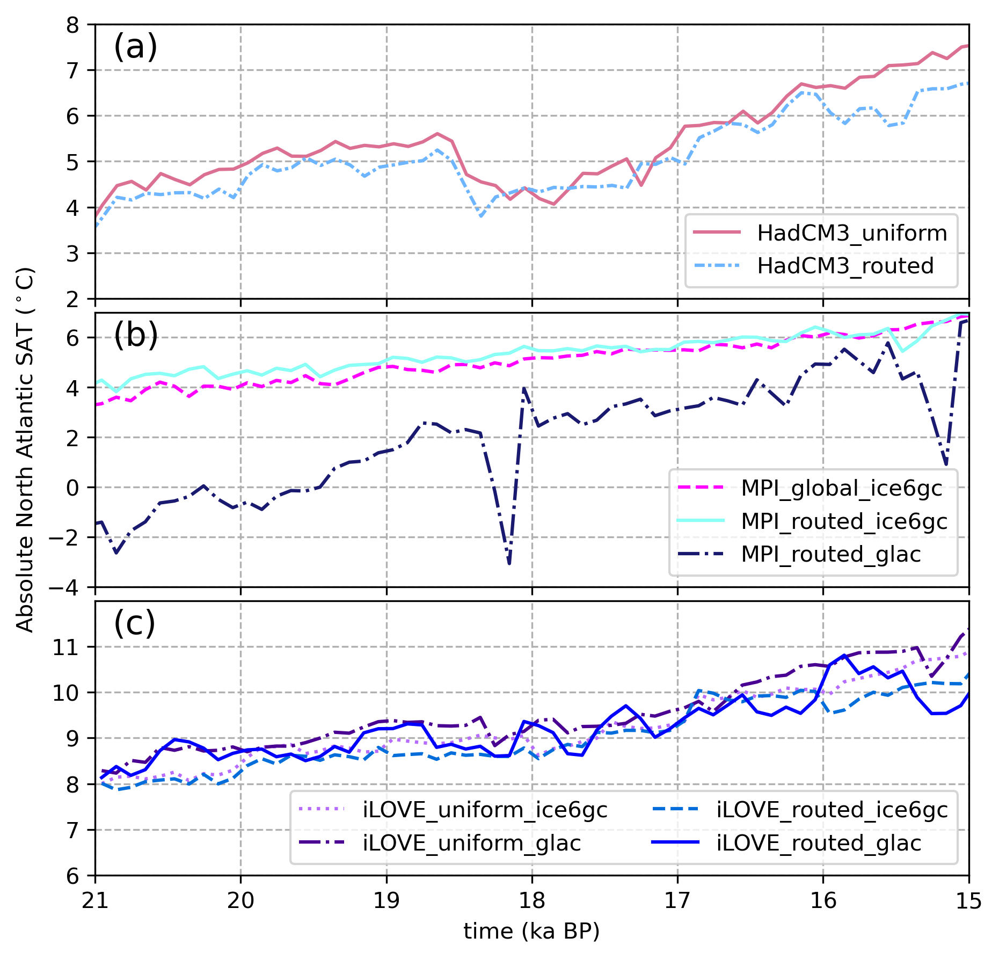

In [4]:

location = 'NATL'
location_timeseries = 'NATL_temp_timeseries10'
fig, axs = plt.subplots(3,1, sharex = True, figsize = (7, 7), dpi = 300, gridspec_kw = {'hspace': 0.05, 'wspace': 0.35})

for expt in expt_order_main:
    if 'hadcm3' == expt['model']:
        if expt['meltwater_scenario'] != 'trace':
            axs[0].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(expt[location_timeseries]), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])
    elif 'mpi-esm-cr' == expt['model']:
        axs[1].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(expt[location_timeseries]), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])        
    elif 'iloveclim' == expt['model']:
        axs[2].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(expt[location_timeseries]), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])

    
    
axs[0].legend(loc='lower right')
#axs[0].set_ylabel('HadCM3 simulations')
axs[0].set_ylim(2,8)



axs[1].legend(loc = 'lower right')
axs[1].set_ylabel('Absolute North Atlantic SAT ($^\circ$C)')
axs[1].set_ylim(-4,7)


axs[2].legend(loc='lower right', ncol=2)
#axs[2].set_ylabel('iLOVECLIM simulations')
axs[2].set_ylim(6,12)
axs[2].set_yticks([6,7,8,9,10,11])





plt.xlim(21,15)
plt.xlabel('time (ka BP)')
#axs[0].set_title(location + ' decadal absolute temperature ($^\circ$C)')
letters = ['(a)', '(b)', '(c)']

for ax,letter in zip(axs,letters):
    #ax.set_ylim(-25,20)
    #ax.set_yticks([-40,-35,-30,-25,-20])
    ax.grid(axis = 'both', linestyle = '--')
    #ax.axvspan(18, 14.7, alpha=0.3, color='lightgrey')
    #ax.axvspan(14.7, 12.9, alpha = 0.2, color = 'slategrey')
    ax.text(.02, 0.88, letter, transform=ax.transAxes, fontsize=15)


fig3 = plt.gcf()

plt.show()
fig3.savefig('/nfs/mary/Users/ee19b2s/work/chapter1/figures/figures_for_manuscript/final_figures_pdfs/fig09_hadcm3_ilove_mpi_100yr_absoluteSAT.pdf', format='pdf', dpi = 300, bbox_inches = 'tight')

# fig02: GRN SAT and NH max AMOC

/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/modules/hadcm3_functions.py:280: UserWarning: Warning: converting a masked element to nan.
  outputDATA = np.array(outputDATA)
/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/modules/hadcm3_functions.py:280: UserWarning: Warning: converting a masked element to nan.
  outputDATA = np.array(outputDATA)
/tmp/ipykernel_83655/3974359479.py:108: UserWarning: FixedFormatter should only be used together with FixedLocator
  s2_2.set_yticklabels(['', '0.06', '0.07', '0.08', '0.09', '0.10'])
/tmp/ipykernel_83655/3974359479.py:113: UserWarning: FixedFormatter should only be used together with FixedLocator
  s2_2.set_yticklabels(['', '0.06', '0.07', '0.08', '0.09', '0.10'])
/tmp/ipykernel_83655/3974359479.py:118: UserWarning: FixedFormatter should only be used together with FixedLocator
  s2_2.set_yticklabels(['', '0.06', '0.07', '0.08', '0.09', '0.10'])


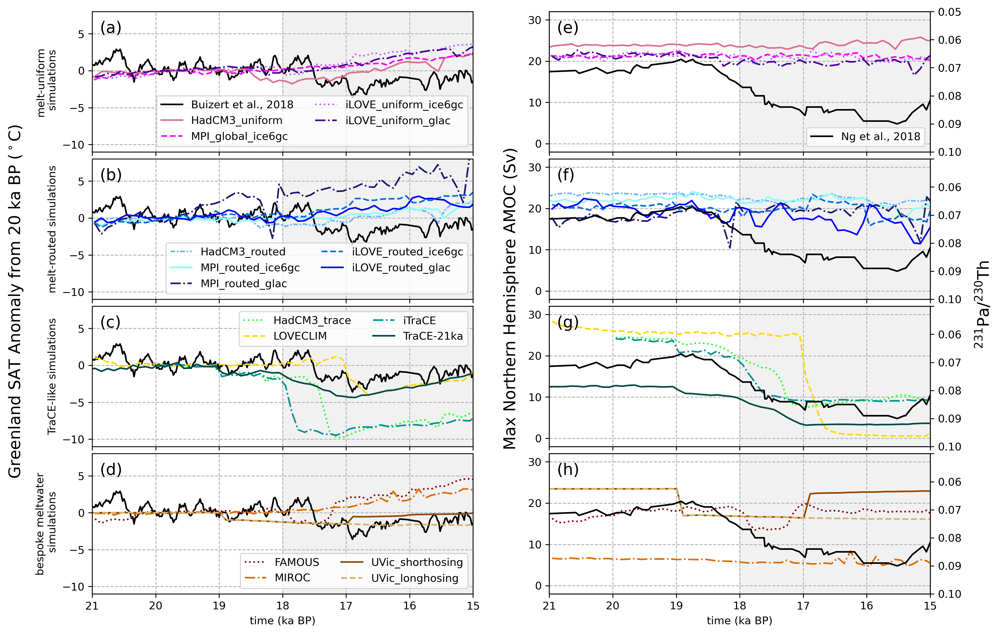

In [3]:
buizert_grn= pd.read_csv('/nfs/mary/Users/ee19b2s/work/data/downloaded_data/GISP2_buizert_2018.csv')
buizert_grn = np.array(buizert_grn)
proxy_grn = np.flipud(buizert_grn[:,2])
time_GRN = np.flipud(buizert_grn[:,0]/1000)

proxy_grn_rev_anom = func4comp.calc_anom_from_lgm20ka_long(proxy_grn, time_GRN)


uniform_sims = []
routed_sims = []
trace_sims = []
bespoke_sims = []
for expt in expt_order_main_wUvic:
    if expt['meltwater_scenario'] == 'uniform':
        uniform_sims.append(expt)
    elif expt['meltwater_scenario'] == 'routed':
        routed_sims.append(expt)
    elif expt['meltwater_scenario'] == 'trace':
        trace_sims.append(expt)
    elif expt['meltwater_scenario'] == 'bespoke':
        bespoke_sims.append(expt)
        
        
location = 'greenland'
location_timeseries = 'grn_temp_timeseries10'
fig, axs = plt.subplots(4,2, sharex = True, figsize = (14, 10), dpi = 300, gridspec_kw = {'hspace': 0.05, 'wspace': 0.2})


axs[0,0].plot(time_GRN, proxy_grn_rev_anom, color = 'black',label='Buizert et al., 2018')    
axs[1,0].plot(time_GRN, proxy_grn_rev_anom, color = 'black')    
axs[2,0].plot(time_GRN, proxy_grn_rev_anom, color = 'black')    
axs[3,0].plot(time_GRN, proxy_grn_rev_anom, color = 'black')    

group = uniform_sims
for expt in group:
    axs[0,0].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(func4comp.calc_anom_from_lgm20ka_long(expt[location_timeseries], expt['time10'])), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])


axs[0,0].legend(loc = 'lower right', ncol=2)
axs[0,0].set_ylabel('melt-uniform\n simulations')



group = routed_sims
for expt in group:
    axs[1,0].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(func4comp.calc_anom_from_lgm20ka_long(expt[location_timeseries], expt['time10'])), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])



axs[1,0].legend(loc = 'lower right', ncol=2)
axs[1,0].set_ylabel('melt-routed simulations')



group = trace_sims
for expt in group:
    axs[2,0].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(func4comp.calc_anom_from_lgm20ka_long(expt[location_timeseries], expt['time10'])), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])

axs[2,0].legend(loc = 'upper right', ncol=2)
axs[2,0].set_ylabel('TraCE-like simulations')



group = bespoke_sims
for expt in group:
    if 'uvic' in expt['expt_name']:
        axs[3,0].plot(expt['time10'], calc_anom_from_lgm20ka_long(expt[location_timeseries], expt['time10']), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])
    else:
        axs[3,0].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(func4comp.calc_anom_from_lgm20ka_long(expt[location_timeseries], expt['time10'])), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])

axs[3,0].legend(loc = 'lower right', ncol=2)
axs[3,0].set_ylabel('bespoke meltwater\n simulations')


axs[0,0].text(-0.2,-2.3,'Greenland SAT Anomaly from 20 ka BP ($^\circ$C)', rotation=90, fontsize=15, transform=axs[0,0].transAxes, ha='center')




plt.xlim(21,15)
axs[3,0].set_xlabel('time (ka BP)')
letters=['(a)','(b)','(c)','(d)']

for ax,letter in zip(axs[:,0],letters):
    ax.grid(axis = 'both', linestyle = '--')
    ax.axvspan(18, 14.7, alpha=0.3, color='lightgrey')
    ax.axvspan(14.7, 12.9, alpha = 0.2, color = 'slategrey')
    ax.text(.02,.85, letter, transform=ax.transAxes, fontsize=15)
    ax.set_ylim(-11,8)

    
    
file = '/nfs/mary/Users/ee19b2s/work/data/downloaded_data/Ng_etal_2018/JC094_EW9209_Pa-Th_compostite.tab'
model = pd.read_csv(file, sep='\t', skiprows=9, header=1)

  
location_timeseries = 'NH_max_amoc10'


s2_2 = axs[0,1].twinx()
s2_2.plot(model['Age [ka BP]'], model['231Pa/230Th xs,0 (Pa/Th composite curve (9-poin...)'], color ='black', label = 'Ng et al., 2018')
s2_2.set_ylim(.1,.05)
s2_2.legend(loc = 'lower right')

s2_2 = axs[1,1].twinx()
s2_2.plot(model['Age [ka BP]'], model['231Pa/230Th xs,0 (Pa/Th composite curve (9-poin...)'], color ='black')
s2_2.set_ylim(.1,.05)
s2_2.set_yticklabels(['', '0.06', '0.07', '0.08', '0.09', '0.10'])

s2_2 = axs[2,1].twinx()
s2_2.plot(model['Age [ka BP]'], model['231Pa/230Th xs,0 (Pa/Th composite curve (9-poin...)'], color ='black')
s2_2.set_ylim(.1,.05)
s2_2.set_yticklabels(['', '0.06', '0.07', '0.08', '0.09', '0.10'])

s2_2 = axs[3,1].twinx()
s2_2.plot(model['Age [ka BP]'], model['231Pa/230Th xs,0 (Pa/Th composite curve (9-poin...)'], color ='black')
s2_2.set_ylim(.1,.05)
s2_2.set_yticklabels(['', '0.06', '0.07', '0.08', '0.09', '0.10'])

s2_2.text(1.14,1.77,'${}^{231}$Pa/${}^{230}$Th', rotation=90, fontsize=15, transform=s2_2.transAxes, ha='center')


group = uniform_sims
for expt in group:
    if 'iloveclim' in expt['expt_name']:
        axs[0,1].plot(hf.means_10yr_calc(expt['time10_ocean']), hf.means_10yr_calc(expt[location_timeseries]), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])        
    else:
        axs[0,1].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(expt[location_timeseries]), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])


group = routed_sims
for expt in group:
    if 'iloveclim' in expt['expt_name']:
        axs[1,1].plot(hf.means_10yr_calc(expt['time10_ocean']), hf.means_10yr_calc(expt[location_timeseries]), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])      
    else:
        axs[1,1].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(expt[location_timeseries]), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])


group = trace_sims
for expt in group:
    if 'loveclim' == expt['expt_name']:
        axs[2,1].plot(hf.means_10yr_calc(expt['time10_ocean']), hf.means_10yr_calc(expt[location_timeseries]), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])        
    else:
        axs[2,1].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(expt[location_timeseries]), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])



group = bespoke_sims
for expt in group:
    if 'uvic' in expt['expt_name']:
        axs[3,1].plot(expt['time10'], expt[location_timeseries], color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])
    else:
        axs[3,1].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(expt[location_timeseries]), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])


axs[3,1].set_xlabel('time (ka BP)')



axs[0,1].text(-0.1,-2.1,'Max Northern Hemisphere AMOC (Sv)', rotation=90, fontsize=15, transform=axs[0,1].transAxes, ha='center')



plt.xlim(21,15)
plt.xlabel('time (ka BP)')
letters=['(e)','(f)','(g)','(h)']

for ax,letter in zip(axs[:,1],letters):
    ax.grid(axis = 'both', linestyle = '--')
    ax.axvspan(18, 14.7, alpha=0.3, color='lightgrey')
    ax.axvspan(14.7, 12.9, alpha = 0.2, color = 'slategrey')
    ax.text(.02,.85, letter, transform=ax.transAxes, fontsize=15)
    ax.set_ylim(-2,32)

fig3 = plt.gcf()

plt.show()
fig3.savefig('/nfs/mary/Users/ee19b2s/work/chapter1/figures/figures_for_manuscript/final_figures_pdfs/fig02_' + location + '_temperature_SAT_and_AMOC.pdf', format='pdf', dpi = 300, bbox_inches = 'tight')

# figS05: tropical SAT and absolute NATL SAT

/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/modules/hadcm3_functions.py:280: UserWarning: Warning: converting a masked element to nan.
  outputDATA = np.array(outputDATA)
/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/modules/hadcm3_functions.py:280: UserWarning: Warning: converting a masked element to nan.
  outputDATA = np.array(outputDATA)
/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/modules/hadcm3_functions.py:280: UserWarning: Warning: converting a masked element to nan.
  outputDATA = np.array(outputDATA)
/nfs/mary/Users/ee19b2s/work/chapter1/hs1_pmip_proj/modules/hadcm3_functions.py:280: UserWarning: Warning: converting a masked element to nan.
  outputDATA = np.array(outputDATA)


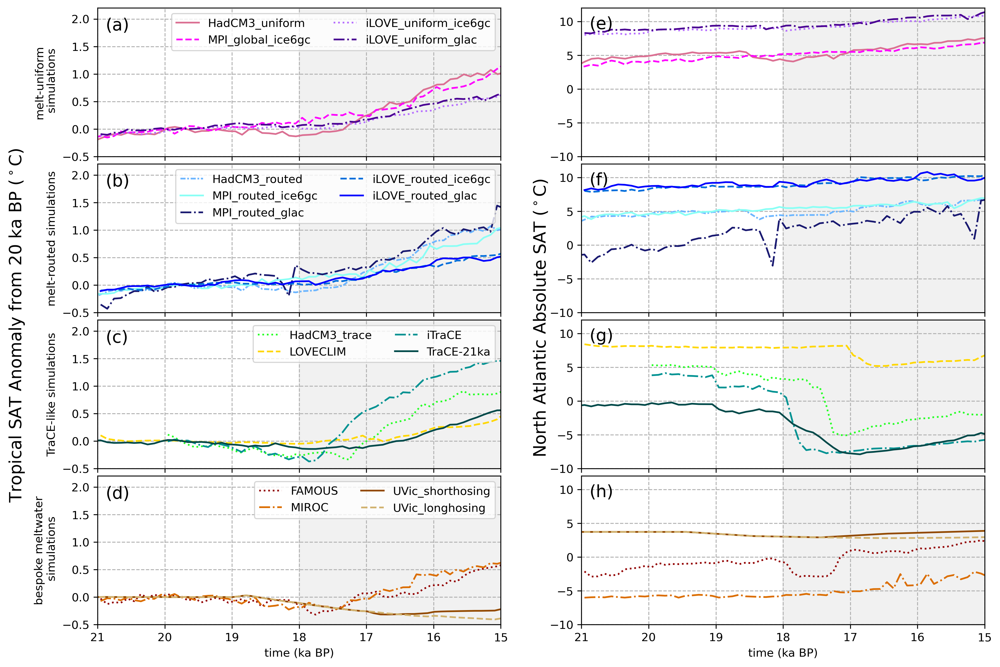

In [2]:

uniform_sims = []
routed_sims = []
trace_sims = []
bespoke_sims = []
for expt in expt_order_main_wUvic:
    if expt['meltwater_scenario'] == 'uniform':
        uniform_sims.append(expt)
    elif expt['meltwater_scenario'] == 'routed':
        routed_sims.append(expt)
    elif expt['meltwater_scenario'] == 'trace':
        trace_sims.append(expt)
    elif expt['meltwater_scenario'] == 'bespoke':
        bespoke_sims.append(expt)
        
        
location = 'tropics'
location_timeseries = 'tropics_temp_timeseries10'
fig, axs = plt.subplots(4,2, sharex = True, figsize = (14, 10), dpi = 300, gridspec_kw = {'hspace': 0.05, 'wspace': 0.2})

group = uniform_sims
for expt in group:
    axs[0,0].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(func4comp.calc_anom_from_lgm20ka_long(expt[location_timeseries], expt['time10'])), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])


axs[0,0].legend(loc = 'upper right', ncol=2)
axs[0,0].set_ylabel('melt-uniform\n simulations')


group = routed_sims
for expt in group:
    axs[1,0].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(func4comp.calc_anom_from_lgm20ka_long(expt[location_timeseries], expt['time10'])), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])



axs[1,0].legend(loc = 'upper right', ncol=2)
axs[1,0].set_ylabel('melt-routed simulations')



group = trace_sims
for expt in group:
    axs[2,0].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(func4comp.calc_anom_from_lgm20ka_long(expt[location_timeseries], expt['time10'])), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])

axs[2,0].legend(loc = 'upper right', ncol=2)
axs[2,0].set_ylabel('TraCE-like simulations')



group = bespoke_sims
for expt in group:
    if 'uvic' in expt['expt_name']:
        axs[3,0].plot(expt['time10'], calc_anom_from_lgm20ka_long(expt[location_timeseries], expt['time10']), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])
    else:
        axs[3,0].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(func4comp.calc_anom_from_lgm20ka_long(expt[location_timeseries], expt['time10'])), color=expt['color'], linestyle=expt['linestyle'], label=expt['label'])

axs[3,0].legend(loc = 'upper right', ncol=2)
axs[3,0].set_ylabel('bespoke meltwater\n simulations')


axs[0,0].text(-0.2,-2.3,'Tropical SAT Anomaly from 20 ka BP ($^\circ$C)', rotation=90, fontsize=15, transform=axs[0,0].transAxes, ha='center')




plt.xlim(21,15)
axs[3,0].set_xlabel('time (ka BP)')
letters=['(a)','(b)','(c)','(d)']

for ax,letter in zip(axs[:,0],letters):
    ax.grid(axis = 'both', linestyle = '--')
    ax.axvspan(18, 14.7, alpha=0.3, color='lightgrey')
    ax.axvspan(14.7, 12.9, alpha = 0.2, color = 'slategrey')
    ax.text(.02,.85, letter, transform=ax.transAxes, fontsize=15)
    ax.set_ylim(-0.5,2.2)

    
location = 'NATL'
location_timeseries = 'NATL_temp_timeseries10'

group = uniform_sims
for expt in group:
    axs[0,1].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(expt[location_timeseries]), color=expt['color'], label=expt['label'], linestyle=expt['linestyle'])


group = routed_sims
for expt in group:
    axs[1,1].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(expt[location_timeseries]), color=expt['color'], label=expt['label'], linestyle=expt['linestyle'])


group = trace_sims
for expt in group:
    axs[2,1].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(expt[location_timeseries]), color=expt['color'], label=expt['label'], linestyle=expt['linestyle'])


group = bespoke_sims
for expt in group:
    axs[3,1].plot(hf.means_10yr_calc(expt['time10']), hf.means_10yr_calc(expt[location_timeseries]), color=expt['color'], label=expt['label'], linestyle=expt['linestyle'])




plt.xlim(21,15)
plt.xlabel('time (ka BP)')
axs[0,1].text(-0.1,-2,'North Atlantic Absolute SAT ($^\circ$C)', rotation=90, fontsize=15, transform=axs[0,1].transAxes, ha='center')
letters=['(e)','(f)','(g)','(h)']

for ax,letter in zip(axs[:,1],letters):
    ax.axvspan(18, 14.7, alpha=0.3, color='lightgrey')
    ax.axvspan(14.7, 12.9, alpha = 0.2, color = 'slategrey')
    ax.text(.02,.86, letter, transform=ax.transAxes, fontsize=15)
    ax.grid(axis = 'both', linestyle = '--')
    ax.set_ylim(-10,12)


fig3 = plt.gcf()

plt.show()
fig3.savefig('/nfs/mary/Users/ee19b2s/work/chapter1/figures/figures_for_manuscript/final_supplementary_figures_pdfs/figS05_tropics_and_NATL_SAT.pdf', format='pdf', dpi = 300, bbox_inches = 'tight')

# figS07: HadCM3_uniform - HadCM3_routed

In [ ]:
variable = vdict.mixLyrDpth
if_precip = False
is_absolute = True
location=None
timeperiods_ka = [18, 17, 16, 15]
timeperiods = [-18000, -17000, -16000, -15000]


fn_deglg = os.path.join(sdict.deglg['path2expt'], variable['var_type'], sdict.deglg['expt_name'] + '.' + variable['var_name'] + '.010yr.nc-1deg')
fn_deglh = os.path.join(sdict.deglh['path2expt'], variable['var_type'], sdict.deglh['expt_name'] + '.' + variable['var_name'] + '.010yr.nc-1deg')

deglg_data, _, lat_had, lon_had,_ = hf.read_cube(fn_deglg, location=location, return_time=False)
deglh_data, _, _, _,_ = hf.read_cube(fn_deglh, location=location, return_time=False, return_lat=False, return_lon=False)

deglg_at_timesteps,_ = func4comp.calc_anom_for_maps20ka_long(deglg_data[:,0,:,:], sdict.deglg['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
deglh_at_timesteps,_ = func4comp.calc_anom_for_maps20ka_long(deglh_data[:,0,:,:], sdict.deglh['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)


deglg_minus_deglh = []
for deglg,deglh in zip(deglg_at_timesteps,deglh_at_timesteps):
    deglg_minus_deglh.append(deglg - deglh)
    
deglg_minus_deglh_mld = deglg_minus_deglh


variable = vdict.temp_mm_1_5m
is_absolute = False

fn_deglg = os.path.join(sdict.deglg['path2expt'], variable['var_type'], sdict.deglg['expt_name'] + '.' + variable['var_name'] + '.010yr.nc-1deg')
fn_deglh = os.path.join(sdict.deglh['path2expt'], variable['var_type'], sdict.deglh['expt_name'] + '.' + variable['var_name'] + '.010yr.nc-1deg')

deglg_data, _, lat_had, lon_had,_ = hf.read_cube(fn_deglg, location=location, return_time=False)
deglh_data, _, _, _,_ = hf.read_cube(fn_deglh, location=location, return_time=False, return_lat=False, return_lon=False)

deglg_at_timesteps,_ = func4comp.calc_anom_for_maps20ka_long(deglg_data[:,0,:,:], sdict.deglg['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
deglh_at_timesteps,_ = func4comp.calc_anom_for_maps20ka_long(deglh_data[:,0,:,:], sdict.deglh['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

deglg_minus_deglh_sat = deglg_minus_deglh


variable = vdict.iceconc_mm_srf

fn_deglg = os.path.join(sdict.deglg['path2expt'], variable['var_type'], sdict.deglg['expt_name'] + '.' + variable['var_name'] + '.010yr.nc-1deg')
fn_deglh = os.path.join(sdict.deglh['path2expt'], variable['var_type'], sdict.deglh['expt_name'] + '.' + variable['var_name'] + '.010yr.nc-1deg')

deglg_data, _, lat_had, lon_had,_ = hf.read_cube(fn_deglg, location=location, return_time=False)
deglh_data, _, _, _,_ = hf.read_cube(fn_deglh, location=location, return_time=False, return_lat=False, return_lon=False)

deglg_at_timesteps,_ = func4comp.calc_anom_for_maps20ka_long(deglg_data[:,0,:,:], sdict.deglg['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)
deglh_at_timesteps,_ = func4comp.calc_anom_for_maps20ka_long(deglh_data[:,0,:,:], sdict.deglh['time10'], timeperiods=timeperiods_ka, timestep='decadal', ka_scale=True, positive=True, precip=if_precip, absolute=is_absolute)

deglg_minus_deglh_ice = deglg_minus_deglh




variable = vdict.temp_mm_1_5m
cmap = variable['cmap']
lw_clip = -20
hi_clip = 20
k = 0
space = 0.25
projection = ccrs.PlateCarree()
axes_class = (GeoAxes, dict(map_project=projection))

fig,axgr = plt.subplots(nrows=3,ncols=len(deglg_minus_deglh),constrained_layout=True, subplot_kw={'projection':projection}, gridspec_kw = {'hspace': 0.01, 'wspace': 0.05})
plt.gcf().set_size_inches(30,12)

for ax,name in zip(axgr[0], timeperiods_ka):
    ax.set_title(str(name)+' ka BP', fontsize=40)


for i,ax in enumerate(axgr[0]):
    variable = vdict.temp_mm_1_5m
    orig_map2=plt.cm.get_cmap('RdBu')
    reversed_map2 = orig_map2.reversed()

    cmap = reversed_map2
    ax.coastlines()
    #ax.add_feature(cfeature.LAND, zorder=1000, edgecolor='k')

    data, lons = add_cyclic_point(deglg_minus_deglh_sat[i], coord=lon)
    contour = ax.contourf(lons, lat, data, 20, transform=ccrs.PlateCarree(), cmap = cmap, norm=mpl.colors.CenteredNorm(vcenter = 0, clip = True), vmin=-1, vmax=1) 
    
    
    ax.set_global()
    
    if i == 3:
        cbar_contour = contour
ticks = range(-5,5,1)
cbar = plt.colorbar(cbar_contour, ax=ax,shrink=.7,ticks=ticks)
cbar.set_label(variable['label'], fontsize=25)
cbar.ax.tick_params(labelsize=20)

for i,ax in enumerate(axgr[1]):
    variable = vdict.iceconc_mm_srf
    cmap = variable['cmap']
    ax.coastlines()

    data, lons = add_cyclic_point(deglg_minus_deglh_ice[i], coord=lon)
    contour = ax.contourf(lons, lat, data, 20, transform=ccrs.PlateCarree(), cmap = cmap, norm=mpl.colors.CenteredNorm(vcenter = 0, clip = True), vmin=-1, vmax=1) 
    
    
    ax.set_global()
    
    if i == 3:
        cbar_contour = contour
        
ticks = [-0.15,-0.10,-0.05,0,0.05,0.10]
cbar = plt.colorbar(cbar_contour, ax=ax,shrink=.8,ticks=ticks)
cbar.set_label(variable['label'], fontsize=25)
cbar.ax.tick_params(labelsize=20)

for i,ax in enumerate(axgr[2]):
    variable = vdict.mixLyrDpth
    cmap = variable['cmap']
    ax.coastlines()

    data, lons = add_cyclic_point(deglg_minus_deglh_mld[i], coord=lon)
    contour = ax.contourf(lons, lat, data, 20, transform=ccrs.PlateCarree(), cmap = cmap, norm=mpl.colors.CenteredNorm(vcenter = 0, clip = True), vmin=-1, vmax=1) 
    
    
    ax.set_global()
    
    if i == 3:
        cbar_contour = contour


cbar = plt.colorbar(cbar_contour, ax=ax,shrink=.7)
cbar.set_label(variable['label'], fontsize=25)
cbar.ax.tick_params(labelsize=20)

axgr[0,0].text(-0.2,0.45, '(a)', transform=axgr[0,0].transAxes, fontsize=40)
axgr[1,0].text(-0.2,0.45, '(b)', transform=axgr[1,0].transAxes, fontsize=40)
axgr[2,0].text(-0.2,0.45, '(c)', transform=axgr[2,0].transAxes, fontsize=40)

panel = plt.gcf()
panel.savefig('/nfs/mary/Users/ee19b2s/work/chapter1/figures/figures_for_manuscript/final_supplementary_figures_pdfs/figS07_HadCM3_uniform_minus_routed.pdf', format='pdf', dpi = 300, bbox_inches = 'tight')

